In [2]:
# prune these

# for grabbing data from APIs
import urllib, json
import requests

# for working with the data
import pandas as pd
import numpy as np
import datetime as dt
#from pandasgui import show

# for visualization 
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.collections import PolyCollection
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from pywaffle import Waffle

# for geodata and GIS prep
import geopandas as gpd
from geopandas import GeoDataFrame

# for mapping
import folium
from shapely.geometry import Point, Polygon
from keplergl import KeplerGl

In [3]:
%%time
# Get the Neighbourhood Profiles data
# See https://docs.ckan.org/en/latest/maintaining/datastore.html for detailed parameters options
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/package_show"
params = { "id": "6e19a90f-971c-46b3-852c-0c48c436d1fc"}
package = requests.get(url, params = params).json()

for idx, resource in enumerate(package["result"]["resources"]):
    if resource["datastore_active"]:
        url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/datastore_search"
        p = { "id": resource["id"], "limit": 3000 }
        data = requests.get(url, params = p).json()
        hood_df = pd.DataFrame(data["result"]["records"])
        break

CPU times: user 271 ms, sys: 57.1 ms, total: 328 ms
Wall time: 4 s


In [4]:
%%time
# Get the COVID-19 Cases in Toronto data
# https://open.toronto.ca/dataset/covid-19-cases-in-toronto/
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/package_show"
params = { "id": "64b54586-6180-4485-83eb-81e8fae3b8fe"}
package = requests.get(url, params = params).json()
for idx, resource in enumerate(package["result"]["resources"]):
    if resource["datastore_active"]:
        url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/datastore_search"
        p = { "id": resource["id"], "limit": 200000 }
        data = requests.get(url, params = p).json()
        cases_df = pd.DataFrame(data["result"]["records"])
        break

CPU times: user 467 ms, sys: 120 ms, total: 586 ms
Wall time: 4.9 s


In [4]:
# get info about the two datasets
# hood_df.info()
# cases_df.info()

In [5]:
# get rid of all the commas in neighbourhoods
hood_df = hood_df.replace(',','', regex=True)
hood_df.head(5)

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,Population 2016,2731571,29113,23757,12054,30526,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804
3,4,Population,Population and dwellings,Census Profile 98-316-X2016001,Population 2011,2615060,30279,21988,11904,29177,...,15004,21343,53350,11703,7826,13986,10578,11652,27713,14687
4,5,Population,Population and dwellings,Census Profile 98-316-X2016001,Population Change 2011-2016,4.50%,-3.90%,8.00%,1.30%,4.60%,...,12.90%,3.80%,0.30%,7.20%,0.50%,2.60%,11.70%,7.50%,-0.40%,0.80%


In [6]:
# probably not using everything all at once, so separate the different categories (e.g. income, language) into their own DFs

# what are all the different categories and classifications?
hood_df.Category.unique()
cases_df.Classification.unique()

array(['CONFIRMED', 'PROBABLE'], dtype=object)

In [7]:
cases_df = cases_df.replace(',','', regex=True)
cases_df.head(2)

,_id,Assigned_ID,Outbreak Associated,Age Group,Neighbourhood Name,FSA,Source of Infection,Classification,Episode Date,Reported Date,Client Gender,Outcome,Ever Hospitalized,Ever in ICU,Ever Intubated
0,1,1,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-22,2020-01-23,FEMALE,RESOLVED,No,No,No
1,2,2,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-21,2020-01-23,MALE,RESOLVED,Yes,No,No


In [8]:
# find record of one of the neighbourhoods with misspelled name
# cases_df[cases_df['Neighbourhood Name'].str.contains("Pellam")]

# fix name discrepancies for danforth east york, briar hill-belgravia, and weston-pelham park
# Pelham Park
cases_df['Neighbourhood Name'] = cases_df['Neighbourhood Name'].replace('Weston-Pellam Park', 'Weston-Pelham Park') 
# Danforth East York
cases_df['Neighbourhood Name'] = cases_df['Neighbourhood Name'].replace('Danforth-East York', 'Danforth East York') 
# Brial Hill-Belgravia
cases_df['Neighbourhood Name'] = cases_df['Neighbourhood Name'].replace('Briar Hill - Belgravia', 'Briar Hill-Belgravia') 

In [9]:
# cases_df['count'] = cases_df.groupby('Neighbourhood Name')['Neighbourhood Name'].transform('count')
# cases_df.head()

# if we want to get data without filtering based on classification
# neighbourhood_count = cases_df.groupby(['Neighbourhood Name']).agg(['count'])

# if we want to get counts of confirmed cases only
# need to email city to find out what they're using in the excel spreadsheet they're using on tableau
counts = cases_df.groupby('Neighbourhood Name')['Classification'].apply(lambda x: (x=='CONFIRMED').sum()).reset_index(name='count')

In [10]:
row_counts = counts.pivot_table(columns='Neighbourhood Name')

In [11]:
#row_counts.insert(0, '_id', 1)
row_counts.insert(1, 'Category', 1)
row_counts.insert(2, 'Topic', 1)
row_counts.insert(3, 'Data Source', 1)
row_counts.insert(4, 'Characteristic', 1)
row_counts.insert(5, 'City of Toronto', 1)

In [12]:
row_counts.head(1)

Neighbourhood Name,,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
count,527,1,1,1,1,1,219,147,105,244,...,93,258,764,44,42,124,41,53,737,349


In [13]:
row_counts.reset_index(None)
row_counts = row_counts.rename_axis(None)

In [14]:
row_counts.loc[hood_df.index[2]] = hood_df.iloc[2]

In [15]:
row_counts.head(3)

Neighbourhood Name,,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
count,527.0,1,1,1,1,1,219,147,105,244,...,93,258,764,44,42,124,41,53,737,349
2,NaN,Population,Population and dwellings,Census Profile 98-316-X2016001,Population 2016,2731571,29113,23757,12054,30526,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804


In [16]:
# row_counts.set_value(1, '_id', 0)
row_counts.loc[2,'_id'] = 1
row_counts.loc[2,'Category'] = 1
row_counts.loc[2,'Topic'] = 1
row_counts.loc[2,'Data Source'] = 1
row_counts.loc[2,'Characteristic'] = 1
row_counts.loc[2,'City of Toronto'] = 1

In [17]:
row_counts.head(2)

Neighbourhood Name,,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park,_id
count,527.0,1,1,1,1,1,219,147,105,244,...,258,764,44,42,124,41,53,737,349,NaN
2,NaN,1,1,1,1,1,29113,23757,12054,30526,...,22156,53485,12541,7865,14349,11817,12528,27593,14804,1.0


In [18]:
row_counts.reset_index(drop=True, inplace=True)
row_counts.head()

Neighbourhood Name,,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park,_id
0,527.0,1,1,1,1,1,219,147,105,244,...,258,764,44,42,124,41,53,737,349,NaN
1,NaN,1,1,1,1,1,29113,23757,12054,30526,...,22156,53485,12541,7865,14349,11817,12528,27593,14804,1.0


In [19]:
#row_counts = row_counts.astype('int64')
cols = row_counts.columns
row_counts[cols] = row_counts[cols].apply(pd.to_numeric, errors='coerce')
# row_counts = pd.to_numeric(row_counts, errors='coerce')

In [20]:
# # add a new row for rate per 100k
# 100000/row 2 value * row 0 value
row_counts.loc[-1] = 100000 / row_counts.iloc[1] * row_counts.iloc[0]  # adding a row
row_counts.index = row_counts.index + 1  # shifting index
row_counts.sort_index(inplace=True) 

In [21]:
row_counts.head()

Neighbourhood Name,,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park,_id
0,NaN,100000.0,100000.0,100000.0,100000.0,100000.0,752.241267,618.764996,871.080139,799.318614,...,1164.470121,1428.43788,350.849215,534.011443,864.171719,346.957773,423.052363,2670.967274,2357.470954,NaN
1,527.0,1.0,1.0,1.0,1.0,1.0,219.000000,147.000000,105.000000,244.000000,...,258.000000,764.00000,44.000000,42.000000,124.000000,41.000000,53.000000,737.000000,349.000000,NaN
2,NaN,1.0,1.0,1.0,1.0,1.0,29113.000000,23757.000000,12054.000000,30526.000000,...,22156.000000,53485.00000,12541.000000,7865.000000,14349.000000,11817.000000,12528.000000,27593.000000,14804.000000,1.0


In [22]:
row_counts = row_counts.drop([2])

In [23]:
# combine with the neighbourhood data
frames = [row_counts, hood_df]
hood_df = pd.concat(frames)

# fix this so it doesn't create a new column
# hood_df.reset_index(None)
# hood_df.iloc[0].astype(int)
hood_df.head()

In [24]:
hood_df = hood_df.drop(['_id', 'Category', 'Topic', 'Data Source', 'City of Toronto'], axis = 1);

In [25]:
#hood_df['Characteristic'].astype(object)
# hood_df['Characteristic'].replace({100000: 'Rate', 1: 'Cases'})

# rename a different way
hood_df.Characteristic[hood_df.Characteristic == 100000] = "Rate"
hood_df.Characteristic[hood_df.Characteristic == 1] = "Cases"
hood_df.head()

<ipython-input-25-db818f362ffd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hood_df.Characteristic[hood_df.Characteristic == 100000] = "Rate"
<ipython-input-25-db818f362ffd>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hood_df.Characteristic[hood_df.Characteristic == 1] = "Cases"


,,Characteristic,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,NaN,Rate,752.241267,618.764996,871.080139,799.318614,454.955768,1789.201789,531.069504,392.596747,...,549.126122,1164.470121,1428.43788,350.849215,534.011443,864.171719,346.957773,423.052363,2670.967274,2357.470954
1,527.0,Cases,219.0,147.0,105.0,244.0,126.0,284.0,137.0,84.0,...,93.0,258.0,764.0,44.0,42.0,124.0,41.0,53.0,737.0,349.0
0,NaN,Neighbourhood Number,129,128,20,95,42,34,76,52,...,37,7,137,64,60,94,100,97,27,31
1,NaN,TSNS2020 Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,NaN,Population 2016,29113,23757,12054,30526,27695,15873,25797,21396,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804


In [26]:
# create a pivot table and use Characteristic column as index
trans = hood_df.set_index('Characteristic').T

In [27]:
trans.head(5)

Characteristic,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,Population density per square kilometre,...,Intraprovincial migrants,Interprovincial migrants,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants
,NaN,527.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Agincourt North,752.241267,219.0,129,No Designation,29113,30279,-3.90%,9371,9120,3929,...,275,75,605,27490,18865,8610,5445,3170,135,2280
Agincourt South-Malvern West,618.764996,147.0,128,No Designation,23757,21988,8.00%,8535,8136,3034,...,320,90,490,22325,13565,8775,5610,3145,220,2170
Alderwood,871.080139,105.0,20,No Designation,12054,11904,1.30%,4732,4616,2435,...,220,40,70,11370,8235,3130,2200,925,70,245
Annex,799.318614,244.0,95,No Designation,30526,29177,4.60%,18109,15934,10863,...,900,385,835,27715,12980,14735,8340,6390,1310,2460


In [28]:
trans.reset_index(inplace = True)
trans.head()

Characteristic,index,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,Intraprovincial migrants,Interprovincial migrants,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants
0,,NaN,527.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Agincourt North,752.241267,219.0,129,No Designation,29113,30279,-3.90%,9371,9120,...,275,75,605,27490,18865,8610,5445,3170,135,2280
2,Agincourt South-Malvern West,618.764996,147.0,128,No Designation,23757,21988,8.00%,8535,8136,...,320,90,490,22325,13565,8775,5610,3145,220,2170
3,Alderwood,871.080139,105.0,20,No Designation,12054,11904,1.30%,4732,4616,...,220,40,70,11370,8235,3130,2200,925,70,245
4,Annex,799.318614,244.0,95,No Designation,30526,29177,4.60%,18109,15934,...,900,385,835,27715,12980,14735,8340,6390,1310,2460


In [29]:
# make sure the values in each column you want to use for visualization are numeric
trans['Population 2016'] = pd.to_numeric(trans['Population 2016'], errors='coerce')
trans['Total private dwellings'] = pd.to_numeric(trans['Total private dwellings'], errors='coerce')
trans['Population density per square kilometre'] = pd.to_numeric(trans['Population density per square kilometre'], errors='coerce')

In [30]:
# fill any NaN values
trans['Population 2016'] = trans['Population 2016'].fillna(0)
trans['Total private dwellings'] = trans['Total private dwellings'].fillna(0)
trans['Population density per square kilometre'] = trans['Population density per square kilometre'].fillna(0)

In [31]:
# set the value types before creating visualization
trans['Population 2016'] = trans['Population 2016'].astype('int64')
#trans = trans[trans['Population 2016'].pd.to_numeric(df['x'], errors='coerce')
trans['Total private dwellings'] = trans['Total private dwellings'].astype('int64')
trans['Population density per square kilometre'] = trans['Population density per square kilometre'].astype('int64')

In [32]:
trans = trans.rename(columns={"index": "Neighbourhood"})
trans.head()

Characteristic,Neighbourhood,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,Intraprovincial migrants,Interprovincial migrants,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants
0,,NaN,527.0,NaN,NaN,0,NaN,NaN,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Agincourt North,752.241267,219.0,129,No Designation,29113,30279,-3.90%,9371,9120,...,275,75,605,27490,18865,8610,5445,3170,135,2280
2,Agincourt South-Malvern West,618.764996,147.0,128,No Designation,23757,21988,8.00%,8535,8136,...,320,90,490,22325,13565,8775,5610,3145,220,2170
3,Alderwood,871.080139,105.0,20,No Designation,12054,11904,1.30%,4732,4616,...,220,40,70,11370,8235,3130,2200,925,70,245
4,Annex,799.318614,244.0,95,No Designation,30526,29177,4.60%,18109,15934,...,900,385,835,27715,12980,14735,8340,6390,1310,2460


In [33]:
# create a column for percentage of visible minorities in neighbourhood
trans['  Total visible minority population'] = pd.to_numeric(trans['  Total visible minority population'], errors='coerce')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].astype('int64')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].fillna(0)
trans['Visible Minority Percentage'] = trans['  Total visible minority population'] / trans['Population 2016'] * 100

In [34]:
# create a column for non-visible minorities
trans['  Not a visible minority'] = pd.to_numeric(trans['  Not a visible minority'], errors='coerce')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].astype('int64')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].fillna(0)
trans['Not a Visible Minority Percentage'] = trans['  Not a visible minority'] / trans['Population 2016'] * 100

In [35]:
trans.head()

Characteristic,Neighbourhood,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants,Visible Minority Percentage,Not a Visible Minority Percentage
0,,NaN,527.0,NaN,NaN,0,NaN,NaN,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Agincourt North,752.241267,219.0,129,No Designation,29113,30279,-3.90%,9371,9120,...,605,27490,18865,8610,5445,3170,135,2280,90.560918,8.467008
2,Agincourt South-Malvern West,618.764996,147.0,128,No Designation,23757,21988,8.00%,8535,8136,...,490,22325,13565,8775,5610,3145,220,2170,84.838153,13.974828
3,Alderwood,871.080139,105.0,20,No Designation,12054,11904,1.30%,4732,4616,...,70,11370,8235,3130,2200,925,70,245,20.657043,79.102373
4,Annex,799.318614,244.0,95,No Designation,30526,29177,4.60%,18109,15934,...,835,27715,12980,14735,8340,6390,1310,2460,23.815764,70.038656


/home/gbby/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/home/gbby/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


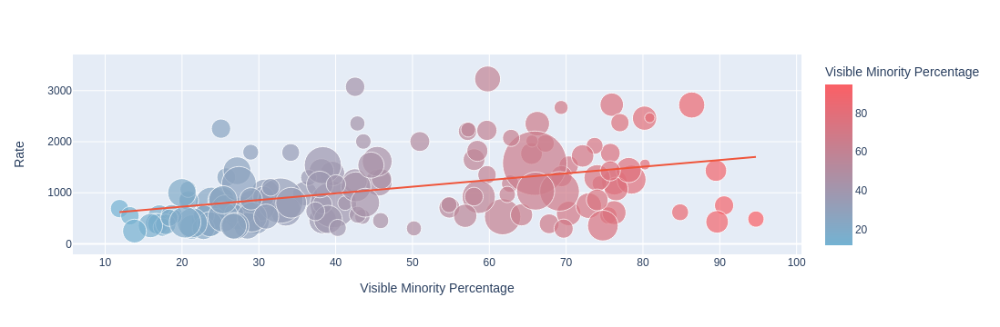

In [36]:
# bubble using plotly express
# see this to set discrete colour scale https://plotly.com/python/discrete-color/
fig = px.scatter(trans, 
                 x="Visible Minority Percentage",
                 y="Rate", 
                 size="Population density per square kilometre", 
                 color="Visible Minority Percentage",
                 color_continuous_scale=[[0, '#74b3d3'], [1.0, '#fb6066']],
                 hover_name="Neighbourhood",
                 trendline="ols",
                 # log_x=True,
                 size_max=50
                )
#plotly.offline.plot(fig, filename='nightingale_bubble.html')
fig.show()

# what would happen if we set a condition where we'd only draw from neighbourhoods above a certain population density?

In [37]:
trans.to_csv('data/toronto_neighbourhood_covid.csv')

In [40]:
# don't need this for the time being, but keep since it's a bit more current than the df from the API
# move this stuff back up to the top

# get COVID neighbourhood data from the city https://drive.google.com/file/d/1jzH64LvFQ-UsDibXO0MOtvjbL2CvnV3N/view
# this is all recent COVID cases
# https://www.toronto.ca/home/covid-19/covid-19-latest-city-of-toronto-news/covid-19-status-of-cases-in-toronto/
# need to set up to read from api instead of downloaded file
#to_df = pd.read_excel('data/CityofToronto_COVID-19_NeighbourhoodData.xlsx', 2)
to_df = pd.read_csv('data/CityofToronto_COVID-19_NeighbourhoodData.csv')
to_geo = gpd.read_file("geodata/NEIGHBORHOODS_WGS84.shp")

In [41]:
to_df.head()

,Neighbourhood ID,Neighbourhood Name,"Rate per 100,000 people",Case Count
0,1.0,West Humber-Clairville,16672.670509,5554
1,2.0,Mount Olive-Silverstone-Jamestown,16243.855071,5353
2,3.0,Thistletown-Beaumond Heights,17364.864865,1799
3,4.0,Rexdale-Kipling,13011.682021,1370
4,5.0,Elms-Old Rexdale,14445.854484,1366


In [42]:
# get rid of trailing zeroes in ID column
to_df['Neighbourhood ID'] = to_df['Neighbourhood ID'].fillna(0)
to_df['Neighbourhood ID'] = to_df['Neighbourhood ID'].astype('int64')      
# to_df['Neighbourhood ID'] = to_df['Neighbourhood ID'].str.replace('.0', ' ')
to_df.sort_values(by=['Neighbourhood Name'], ascending=True)

,Neighbourhood ID,Neighbourhood Name,"Rate per 100,000 people",Case Count
128,129,Agincourt North,6996.874249,2037
127,128,Agincourt South-Malvern West,8115.502799,1928
19,20,Alderwood,8470.217355,1021
94,95,Annex,6859.726135,2094
41,42,Banbury-Don Mills,6528.254198,1808
...,...,...,...,...
93,94,Wychwood,8244.476967,1183
99,100,Yonge-Eglinton,6042.142676,714
96,97,Yonge-St.Clair,5619.412516,704
26,27,York University Heights,16203.384916,4471


In [43]:
# change ID to int64
to_geo['AREA_S_CD'] = to_geo['AREA_S_CD'].astype('int64')
# get rid of the bracketed IDs in the name field
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].str.replace(" \\(\\d+\\)", "")
# fix Pelham Park
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].replace('Weston-Pellam Park', 'Weston-Pelham Park') 
# fix Cabbagetown
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].replace('Cabbagetown-South St.James Town', 'Cabbagetown-South St. James Town') 
# fix North St. James
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].replace('North St.James Town', 'North St. James Town')
to_geo.sort_values(by=['AREA_NAME'], ascending=True)

<ipython-input-43-4fd9430e2b43>:4: FutureWarning:

The default value of regex will change from True to False in a future version.



,AREA_S_CD,AREA_NAME,geometry
79,129,Agincourt North,"POLYGON ((-79.24213 43.80247, -79.24319 43.802..."
80,128,Agincourt South-Malvern West,"POLYGON ((-79.25498 43.78122, -79.25797 43.780..."
86,20,Alderwood,"POLYGON ((-79.54866 43.59022, -79.54876 43.590..."
56,95,Annex,"POLYGON ((-79.39414 43.66872, -79.39588 43.668..."
84,42,Banbury-Don Mills,"POLYGON ((-79.33055 43.73979, -79.33044 43.739..."
...,...,...,...
137,94,Wychwood,"POLYGON ((-79.43592 43.68015, -79.43492 43.680..."
128,100,Yonge-Eglinton,"POLYGON ((-79.41096 43.70408, -79.40962 43.704..."
0,97,Yonge-St.Clair,"POLYGON ((-79.39119 43.68108, -79.39141 43.680..."
1,27,York University Heights,"POLYGON ((-79.50529 43.75987, -79.50488 43.759..."


In [44]:
# don't need any of these anymore, but keep for the sake of posterity

# get rid of the bracketed area code in the area name field
# find name of one of the neighbourhoods that doesn't show up because of name discrepancy
# to_df[to_df['Neighbourhood Name'].str.contains("Cabbagetown")]
# should probably just fix the full geojson directly

In [45]:
# add these so they'll show up in tooltips

# add rate from the pandas df to the geopandas df
# to_geo['Rate Per 100,000'] = to_df['Rate per 100,000 people']
# add case count from the pandas df to the geopandas df
# to_geo['Case Count'] = to_df['Case Count']

In [44]:
# change column names
to_geo = to_geo.rename(columns={'AREA_S_CD': "ID", 'AREA_NAME': "Neighbourhood", 'Case Count': "Cases", 'Rate Per 100,000': "Rate"})
to_df = to_df.rename(columns={'Neighbourhood ID': "ID", 'Neighbourhood Name': "Neighbourhood", 'Case Count': "Cases", 'Rate per 100,000 people': "Rate"})

In [45]:
to_df.sort_values(by=['Rate'], ascending=True)

,ID,Neighbourhood,Rate,Cases
49,50,Newtonbrook East,5118.966267,824
51,52,Bayview Village,5145.821649,1101
102,103,Lawrence Park South,5250.675275,797
50,51,Willowdale East,5405.083872,2726
47,48,Hillcrest Village,5580.488957,945
...,...,...,...,...
2,3,Thistletown-Beaumond Heights,17364.864865,1799
25,26,Downsview-Roding-CFB,17950.473582,6292
21,22,Humbermede,18481.826954,2873
28,29,Maple Leaf,19384.828405,1960


In [46]:
to_geo.sort_values(by=['Neighbourhood'], ascending=True)

,ID,Neighbourhood,geometry
79,129,Agincourt North,"POLYGON ((-79.24213 43.80247, -79.24319 43.802..."
80,128,Agincourt South-Malvern West,"POLYGON ((-79.25498 43.78122, -79.25797 43.780..."
86,20,Alderwood,"POLYGON ((-79.54866 43.59022, -79.54876 43.590..."
56,95,Annex,"POLYGON ((-79.39414 43.66872, -79.39588 43.668..."
84,42,Banbury-Don Mills,"POLYGON ((-79.33055 43.73979, -79.33044 43.739..."
...,...,...,...
137,94,Wychwood,"POLYGON ((-79.43592 43.68015, -79.43492 43.680..."
128,100,Yonge-Eglinton,"POLYGON ((-79.41096 43.70408, -79.40962 43.704..."
0,97,Yonge-St.Clair,"POLYGON ((-79.39119 43.68108, -79.39141 43.680..."
1,27,York University Heights,"POLYGON ((-79.50529 43.75987, -79.50488 43.759..."


In [47]:
# use merge to get the columns from to_df
merged_geo = pd.merge(to_df, to_geo, on=['ID', 'Neighbourhood'])

In [48]:
# need this turn the merged df into a geo df (basically, to get folium to recognize the geometry)
merged_geo = GeoDataFrame(merged_geo)

In [49]:
merged_geo.head()

,ID,Neighbourhood,Rate,Cases,geometry
0,1,West Humber-Clairville,16672.670509,5554,"POLYGON ((-79.55236 43.70947, -79.55238 43.709..."
1,2,Mount Olive-Silverstone-Jamestown,16243.855071,5353,"POLYGON ((-79.60338 43.75786, -79.60205 43.758..."
2,3,Thistletown-Beaumond Heights,17364.864865,1799,"POLYGON ((-79.57751 43.73384, -79.57806 43.734..."
3,4,Rexdale-Kipling,13011.682021,1370,"POLYGON ((-79.55512 43.71510, -79.55504 43.714..."
4,5,Elms-Old Rexdale,14445.854484,1366,"POLYGON ((-79.55512 43.71510, -79.55569 43.716..."


In [50]:
# case count map
map_cases = folium.Map(location=[43.653963, -79.387207], zoom_start=10)
# use this if want to load from a geojson file toronto_geo = "./geodata/to_geo.geojson"
folium.Choropleth(
    geo_data=merged_geo, # otherwise, use the geodataframe stored above
    data = to_df,
    columns=['Neighbourhood','Cases'],
    key_on='feature.properties.Neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Case Count by Neighbourhood').add_to(map_cases)

folium.GeoJson(
        merged_geo, 
        name='Toronto Neighbourhoods',
        show=True,
        style_function=lambda feature: {
            # 'fillColor': 'YlOrRd',
            'color': 'YlOrRd',
            'weight': .1,
            'dashArray': '5, 5',
            'fillOpacity':0
        },   
        highlight_function=lambda x: {'weight':1, 
                                      'color':'black'
                                      #'fillOpacity':1
                                     },    
        tooltip=folium.features.GeoJsonTooltip(
            fields=['Neighbourhood', 'ID', 'Cases', 'Rate'],
            labels=True,                              
        ),  
).add_to(map_cases)
    
map_cases
# demonstrate how the PHU names in the public shapefile don't match

In [53]:
# interactive rate map
map_rate = folium.Map(location=[43.653963, -79.387207], zoom_start=10)
# to_geo = "./geodata/to_geo.geojson"
folium.Choropleth(
    geo_data=merged_geo,
    data = to_df,
    columns=['Neighbourhood','Rate'],
    key_on='feature.properties.Neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Rate per 100,000 people').add_to(map_rate)

folium.GeoJson(
        merged_geo, 
        name='Toronto Neighbourhoods',
        show=True,
        style_function=lambda feature: {
            # 'fillColor': 'YlOrRd',
            'color': 'YlOrRd',
            'weight': .1,
            'dashArray': '5, 5',
            'fillOpacity':0
        },   
        highlight_function=lambda x: {'weight':1, 
                                      'color':'black'
                                      #'fillOpacity':1
                                     },    
        tooltip=folium.features.GeoJsonTooltip(
            fields=['Neighbourhood', 'ID', 'Cases', 'Rate'],
            labels=True,                              
        ),  
).add_to(map_rate)
    
map_rate

# double-check that colors are accurate


In [54]:
# next steps: add 3D, customize tooltips, and make more maps
# maybe also do other regions or the entire country. what boundary-level data is available?
# https://towardsdatascience.com/an-interactive-3d-map-of-police-action-s-that-have-resulted-in-death-b9d7fbf81822
# https://medium.com/vis-gl/introducing-kepler-gl-for-jupyter-f72d41659fbf
# https://towardsdatascience.com/mapping-with-matplotlib-pandas-geopandas-and-basemap-in-python-d11b57ab5dac
# clean up tooltips https://towardsdatascience.com/using-folium-to-generate-choropleth-map-with-customised-tooltips-12e4cec42af2

In [51]:
# write to file for use in QGIS
merged_geo.to_file('geodata/merged_geo.geojson', driver='GeoJSON')

/home/gbby/.local/lib/python3.8/site-packages/geopandas/io/file.py:234: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



In [52]:
merged_geo = merged_geo.to_crs(epsg=4326)

In [58]:
# get centroids if want to use for hexbin 3D in kepler map

# centroid = to_geo['geometry'].to_crs()
# centroidseries = to_geo['geometry'].centroid
merged_geo["x"] = merged_geo['geometry'].centroid.x
merged_geo["y"] = merged_geo['geometry'].centroid.y

#def getXY(pt):
#    return (pt.x, pt.y)
#centroidseries = to_geo['geometry'].centroid
#x,y = [list(t) for t in zip(*map(getXY, centroidseries))]
#to_geo['geometry'].centroid
merged_geo.head()
merged_geo.to_csv('data/toronto_hoods.csv', index=False)

<ipython-input-58-852895ab463e>:5: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


<ipython-input-58-852895ab463e>:6: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [57]:
# sort to_df by rate (or count) to get the top 5 and bottom 5
trans_sorted = trans.sort_values(by=['Cases'], ascending=False)
trans_sorted.head()
trans_sorted.to_csv('data/toronto_covid.csv', index=False)

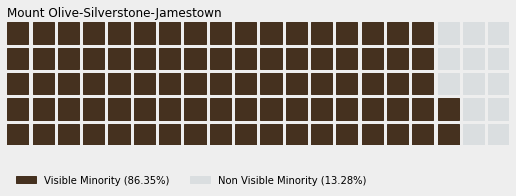

In [66]:
# waffles
data = {'Visible Minority': 86.35, 'Non Visible Minority': 13.28}

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=data, 
    colors=("#45311f", "#dadee0"), # change colours to be more emotive
    title={'label': 'Mount Olive-Silverstone-Jamestown', 'loc': 'left'},
    labels=[f"{k} ({v}%)" for k, v in data.items()],
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
    starting_location='NW',
    block_arranging_style='snake',
    tight=False,
    figsize=(9, 6)
)
fig.set_facecolor('#EEEEEE')
plt.show() # need to output to png
fig.savefig('./images/mount.png')

In [68]:
# sort to_df by rate (or count) to get the top 5 and bottom 5
trans_sorted.tail()

Characteristic,Neighbourhood,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants,Visible Minority Percentage,Not a Visible Minority Percentage
137,Yonge-Eglinton,346.957773,41.0,100,No Designation,11817,10578,11.70%,6103,5676,...,325,11230,5785,5450,3020,2425,290,1160,26.698824,73.199628
67,Lambton Baby Point,488.41578,39.0,114,No Designation,7985,7921,0.80%,3217,3121,...,65,7515,5110,2405,1800,600,75,265,24.420789,75.516594
17,Bridle Path-Sunnybrook-York Mills,388.51716,36.0,41,No Designation,9266,8713,6.30%,3478,3241,...,130,8825,5715,3105,2210,890,120,395,29.840276,69.231599
107,Runnymede-Bloor West Village,357.497517,36.0,89,No Designation,10070,9632,4.50%,3987,3818,...,120,9295,6725,2575,1775,805,75,335,15.888779,84.061569
15,Blake-Jones,465.898796,36.0,69,No Designation,7727,7763,-0.50%,3269,3125,...,85,7195,4905,2295,1680,620,95,320,38.307234,61.149217


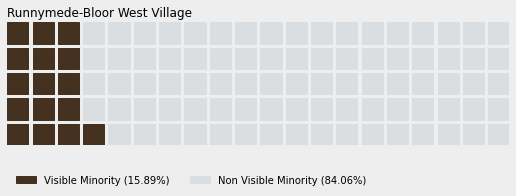

In [69]:
# waffles
data = {'Visible Minority': 15.89, 'Non Visible Minority': 84.06}

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=data, 
    colors=("#45311f", "#dadee0"), # change colours to be more emotive
    title={'label': 'Runnymede-Bloor West Village', 'loc': 'left'},
    labels=[f"{k} ({v}%)" for k, v in data.items()],
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
    starting_location='NW',
    block_arranging_style='snake',
    tight=False,
    figsize=(9, 6)
)
fig.set_facecolor('#EEEEEE')
plt.show() # need to output to png
fig.savefig('./images/runnymede.png')